<a href="https://colab.research.google.com/github/nicolasrondan/cv-um-2023/blob/main/ejemplo-cnn/Practico_4_Reconocimiento_de_Objetos_con_Deep_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title 
from google.colab import drive

drive.mount('/content/drive')

In [ ]:
%cd /content/drive/MyDrive/computer-vision-um/cv-um-2025/practico-4/

# Introducción

En este ejemplo vamos a expandir el trabajo hecho en el practico 4 sobre los distintos algoritmos de reconocimiento de objetos y escenas vistos en clase. En particular vamos a clasificar imágenes de distintos tipos de escenas (Cocina, Dormitorio, Oficina, etc). Para ello se va entrenar una red de convolución capaz de clasificar las 15 categorias. Se  van a clasificar las 15 categorias de imágenes del articulo [Lazebnik et al 2006](https://inc.ucsd.edu/~marni/Igert/Lazebnik_06.pdf).

Los datos de entrenamineto son los mismos del notebook anterior.

Vamos a utilizar la versión de [keras](https://www.tensorflow.org/guide/keras?hl=es-419) incluída en tensorflow para crear los modelos de este notebook y entrenarlos.

## Datos Entrenamiento

Los datos de entrenamineto de este practico los vamos a descargar de la siguiente manera utilizando el comando `gdown` para descargar los datos desde google drive. La ubicación final de los datos sera en la carpeta: 

`/content/sample_data/data`



In [ ]:
import gdown

In [ ]:
file_id = "1Dp2_Vgx0gmj2haUOsQQPZWzrgyT5E-jn"
src_url = f"https://drive.google.com/uc?export=download&confirm=pbef&id={file_id}"
output_file = "/content/sample_data/data.zip"
gdown.download(src_url, output_file, quiet=False, use_cookies=False)

In [ ]:
import shutil

output_folder = '/content/sample_data/'
shutil.unpack_archive(output_file, output_folder)

# Parte1: Cargar datos y armar nuestro dataset de entrenamiento

La primera parte consiste en cargar los datos y armar dos dataframes con los datos de entrenamiento y testing.


In [ ]:
import os
from glob import glob
from typing import List, Tuple

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm

In [ ]:
%load_ext tensorboard

### Elegir los datos de training y testing

In [ ]:
def get_dataset(data_folder:str , categories:List[str], image_per_category:int)-> Tuple[pd.DataFrame]:
    """ Given a data folder extracts paths for images with the selected
    categories. Images should be oganized under folders with the category name

    Args:
        data_folder: Path of folder containing categories folders with images
        categories: List of categories to use load from data
        images_per_category: Number of images per category

    Returns:
        A dataframe containig image paths and category label for the selected 
        folder
    """
    num_categories = len(categories) #number of scene categories.

    #Total entries (15 categories * 155 training images and 55  test examples each)
    image_paths = [] 
    labels = []

    for i in range(0,num_categories):
        
        images = sorted(glob(os.path.join(data_folder, categories[i], '*.jpg')))

        image_paths += images[:image_per_category]
        labels += [categories[i]]*image_per_category 
       
    dataset_df = pd.DataFrame({'image_path':image_paths,'category':labels})        
    return dataset_df



In [ ]:
train_data_folder = '/content/sample_data/data/train'
test_data_folder = '/content/sample_data/data/test'
categories = ['Kitchen', 'Store', 'Bedroom', 'LivingRoom', 'Office', 
       'Industrial', 'Suburb', 'InsideCity', 'TallBuilding', 'Street',
       'Highway', 'OpenCountry', 'Coast', 'Mountain', 'Forest']
abbr_categories = ['Kit', 'Sto', 'Bed', 'Liv', 'Off', 'Ind', 'Sub', 
    'Cty', 'Bld', 'St', 'HW', 'OC', 'Cst', 'Mnt', 'For']

In [ ]:
N_TRAIN_EXAMPLES = 100
N_TEST_EXAMPLES = 50

## Cargar los datos en un dataframe

In [ ]:
train_df = get_dataset(train_data_folder,categories,N_TRAIN_EXAMPLES)
test_df = get_dataset(test_data_folder,categories,N_TEST_EXAMPLES)

In [ ]:
train_df

In [ ]:
test_df

# Parte: 2  Entrenamiento de Modelo Custom

### Vamos a crear nuestro modelo y nuestros generadores de datos

In [ ]:
import tensorflow as tf

In [ ]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPool2D, ReLU, Dense, GlobalAveragePooling2D, Flatten, BatchNormalization, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint ,TensorBoard
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers


### Definicion del modelo

Vamos a crear un modelo basado en bloques de convolución y capas fully connected. Para ello vamos a seguir los siguientes pasos:
1. Definir un `conv_block` que va a ser la base de nuestra red.
2. Construir nuestro modelo custom en base a este bloque de convolución y algunas pocas capas fully conected. Para construir nuestro modelo vamos utilizar la [Functional API](https://www.tensorflow.org/guide/keras/functional) de keras

Vamos a crear un modelo custom utilizando una arquitectura clásica compuesta por capas de convolución para extracción de features, seguidas por capas "_fully-connected_" para clasificación, tal como se ve en la siguiente imagen:

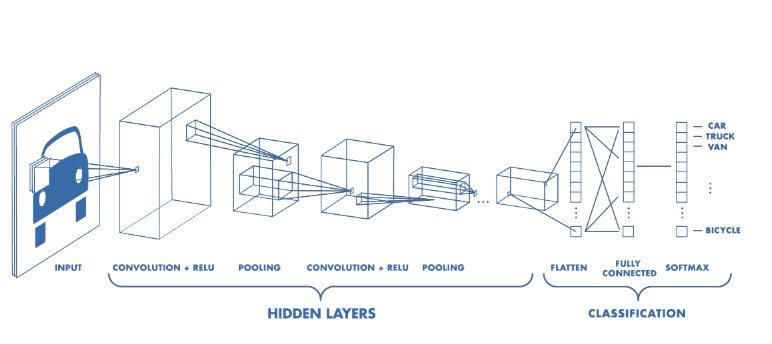

 Image Source: [towards_data_science](https://towardsdatascience.com/basics-of-the-classic-cnn-a3dce1225add)

In [ ]:
def conv_block(input: tf.Tensor, n_filters:int, regularizer_lambda=0)-> tf.Tensor:
    """ Creates a convolutional block composed of Conv2D -> ReLU -> MaxPooling layers.

    Args:
        input: input tensor that will be processed by the convolutional block
        n_filters: number of filters of the convolutional block
        regularizer_lambda: weight decay lambda to apply to convolutional layer
    Returns:
        Returns a subgraph containing the created convolutional block with the input
        attached.
    """
    conv_maps = Conv2D(n_filters, kernel_size=(3,3), 
                       kernel_regularizer=regularizers.l2(regularizer_lambda),
                       bias_regularizer=regularizers.l2(regularizer_lambda)) (input)
    activation_maps = ReLU()(conv_maps)
    pooled_maps = MaxPool2D()(activation_maps)
    return pooled_maps

In [ ]:
def create_model(input_size:Tuple[int], conv_blocks_list:List[int], fully_connected_list:List[int],output_size=15, regularizer_lambda=0)-> Model:
    """ Creates a CNN model convolutional blocks followed by an Average Pooling Layer
    and dense layers.

    Args:
        input_size: desired size of the input layer of the network
        conv_blocks_list: List containing number of filters per convolutional block
        to add to the network. The network will as many conv_blocks as the length of 
        this list.
        fully_connected_list: List containing number of neurons per dense layer
        to add to the network. The network will as many dense layers as the length of 
        this list.
        regularizer_lambda: weight decay lambda to apply to convolutional and desnse layer
    Returns:
        Returns a keras model with the desired layers
    """
    model_input = tf.keras.Input(input_size)
    
    conv_output = conv_block(model_input, conv_blocks_list[0], regularizer_lambda=regularizer_lambda)
    if len(conv_blocks_list) > 1:
      conv_input = conv_output
      for block_size in conv_blocks_list[1:]:
        conv_output = conv_block(conv_input, block_size)
        conv_input = conv_output

    conv_output_flat = GlobalAveragePooling2D() (conv_output)
    
    dense_output = Dense(fully_connected_list[0], activation="relu", kernel_regularizer=regularizers.l2(regularizer_lambda),
        bias_regularizer=regularizers.l2(regularizer_lambda)) (conv_output_flat)
    
    if len(fully_connected_list) > 1:
      dense_input = dense_output
      for dense_layer_size in fully_connected_list[1:]:
        dense_output = Dense(dense_layer_size, activation='relu', kernel_regularizer=regularizers.l2(regularizer_lambda),
        bias_regularizer=regularizers.l2(regularizer_lambda))(dense_input)
        dense_input = dense_output
    

    output_layer = Dense(output_size, activation='softmax') (dense_output)
    model = Model(model_input,output_layer, name='custom_model')
    return model
   


### Modelo CNN Custom

Primero intentemos crear un modelo de red convolucional (CNN) custom creado por nosotros desde cero. Para ello podemos utilizar la función `create_model` que nos permite crear un modelo de red de convolución con la cantidad de bloques de convolución y capas fully conected deseadas.

En particular vamos a crear un modelo con tres bloques de convolución con **64, 128, 256 filtros** de $3\times3$ filtros y dos capas fully connected con **64 y 32** neuronas respectivamente. Para ello vamos a utilizar el siguiente código.

In [ ]:
convolutional_layers = [64,128,256]
fully_connected_layers = [64,32]
simple_model = create_model((64,64,1),conv_blocks_list=convolutional_layers,fully_connected_list=fully_connected_layers)

#### Descripción del modelo ###
Podemos utilizar la función `summary` para ver la descripción de este modelo y la cantidad de parámetros por layer.

In [ ]:
simple_model.summary()

## Compilar el modelo
Para poder entrenar nuestro modelo necesitamos compilarlo y agregarle un optimizador y métricas a optimizar. 
Para ello vamos a utilizar el siguiente código. Donde definimos que la función de loss sea una `categorical_crossentropy` y vamos a monitorear el `accuracy`

In [ ]:
LR = 0.1
simple_model.compile(optimizer=SGD(momentum=0.9, learning_rate=LR),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

### Separemos nuestros datos en train, validation y test
Para poder entrenar nuestro modelo correctamente y estar seguro de que el modelo entrenado es capas de generalizar vamos a tener que separar nuestro dataset en datos de **entrenanmiento** , **validación** y **testing**. Tener un conjunto de validación nos permite poder comparar modelos monitorear el entrenamiento de nuestras redes para evitar el "_overfitting_".

In [ ]:
from sklearn. model_selection import train_test_split

In [ ]:
new_train_df, validation_df= train_test_split(train_df,test_size=0.2,random_state=42)

In [ ]:
validation_df

In [ ]:
new_train_df

## Generadores de datos
Keras nos permite definir generadores de datos que hacen data augmentation automáticamente y nos permiten aplicar operaciones de preprocesamiento sobre nuestros datos. Entrenemos nuestro modelo con el siguiente preprocesamiento.

In [ ]:
train_generator = ImageDataGenerator(horizontal_flip=True, zoom_range=0.15)
validation_generator = ImageDataGenerator()
test_generator = ImageDataGenerator()

In [ ]:
train_data = train_generator.flow_from_dataframe(
    new_train_df, x_col="image_path", y_col="category", target_size=(64, 64), color_mode="grayscale"
)
validation_data = validation_generator.flow_from_dataframe(
    validation_df, x_col="image_path", y_col="category", target_size=(64, 64), color_mode="grayscale"
)
test_data = test_generator.flow_from_dataframe(
    test_df, x_col="image_path", y_col="category", target_size=(64, 64), color_mode="grayscale"
)

### Tensorboard 

Vamos a utilzar [tensorboard](https://www.tensorflow.org/tensorboard?hl=es-419) para monitorear las curvas de entrenamiento de nuestro modelo y poder entender si nuestro modelo se está entrenando correctamente. En este caso vamos a utilizar la extensión de jupyer notebook de tensorboard. Que nos permite ver los resultados de entrenamiento en la siguiente celda. 

In [ ]:
%tensorboard --logdir ./logs/

### Entrenar el modelo ###

In [ ]:
import os
import shutil

In [ ]:
if not os.path.exists("./checkpoints"):
    os.makedirs("./checkpoints")
check_point_simlpe = os.path.join("./checkpoints", "checkpoint_model_simple.keras")

In [ ]:
if os.path.exists("./logs"):
    shutil.rmtree("./logs")
checkpoint = ModelCheckpoint(check_point_simlpe, monitor="val_loss", verbose=1, save_best_only=True, mode="min")

results = simple_model.fit(
    train_data,
    epochs=15,
    batch_size=64,
    validation_data=validation_data,
    callbacks=[checkpoint, TensorBoard(f"./logs/simple_model-LR-{LR}")],
)

### Resultados primer entrenamiento
Al entrenar nuestro modelo con la primera configuración vamos a ver que la curva de error de entrenamiento no se mueve. El entrenamiento en tensorboard debería verse de la siguiente  manera. Esto nos indica que nuestro algoritmo no está aprendiendo a clasificar las escenas de entrada. Para ello vamos a tener que hacer cambios en la configuración.

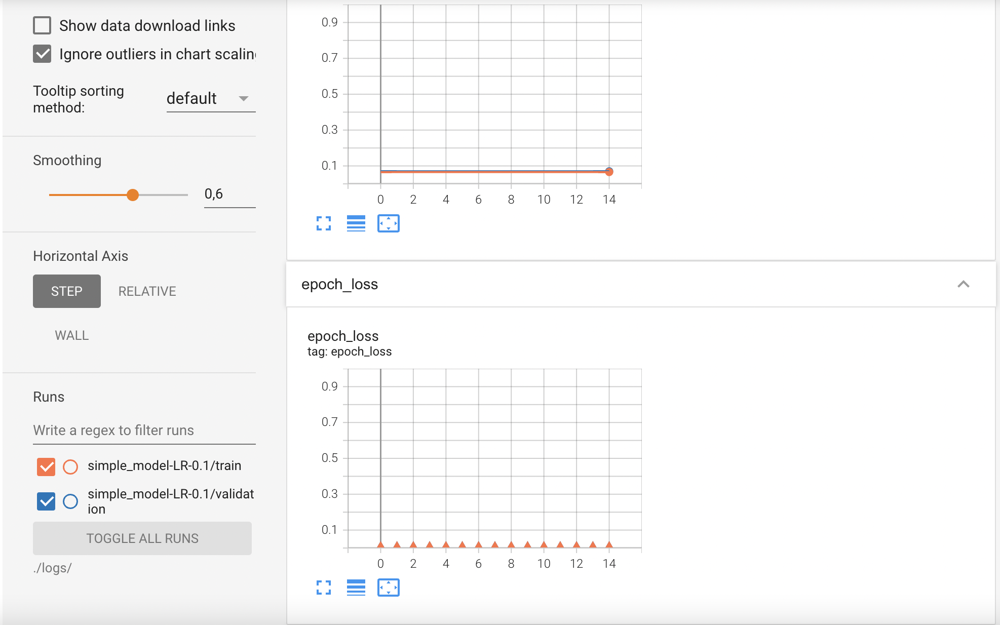

### Normalización de las imágenes de entrada.
Recordemos que en el teórico del curso vimos que es bueno normalizar las imágenes de entrada para poder que el algoritmos de entrenamiento converja más fácilmente. Para ello vamos a modificar los parámetros de [ImageDataGenetartor](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator) que nos permitan reescalar el rango de lás imágenes a **[0,1]** y centrar nuestro dataset en cero. 
En está seccción se pide volver a generar el modelo los data generators y entrenar el nuevo setup durante **120 epochs**

In [ ]:
simple_model = create_model((64,64,1),conv_blocks_list=convolutional_layers,fully_connected_list=fully_connected_layers)


Investigar la documentación del data generator [ImageDataGenetartor](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator) para centrar las imagenes y rescalarlas al rango adecuado

In [ ]:

#train_generator = ImageDataGenerator(horizontal_flip=True, zoom_range=0.15)
#validation_generator = ImageDataGenerator() 
#test_generator = ImageDataGenerator()

In [ ]:
train_data = train_generator.flow_from_dataframe(
    new_train_df, x_col="image_path", y_col="category", target_size=(64, 64), color_mode="grayscale"
)
validation_data = validation_generator.flow_from_dataframe(
    validation_df, x_col="image_path", y_col="category", target_size=(64, 64), color_mode="grayscale"
)
test_data = test_generator.flow_from_dataframe(
    test_df, x_col="image_path", y_col="category", target_size=(64, 64), color_mode="grayscale"
)

In [ ]:
check_point_scaled = os.path.join("./checkpoints", "checkpoint_simple_model-normalized.keras")

In [ ]:
LR = 0.01
simple_model.compile(
    optimizer=SGD(momentum=0.9, learning_rate=LR), loss="categorical_crossentropy", metrics=["accuracy"]
)
checkpoint = ModelCheckpoint(check_point_scaled, monitor="val_loss", verbose=1, save_best_only=True, mode="min")


results = simple_model.fit(
    train_data,
    epochs=60,
    batch_size=64,
    validation_data=validation_data,
    callbacks=[checkpoint, TensorBoard(f"./logs/simple_model-normalized-LR-{LR}")],
)

### TRAIN YOUR MODEL

#### Resultados Normalización ####

Los resultados del entrenamiento con los datos normalizados deberían verse de la siguiente manera. 

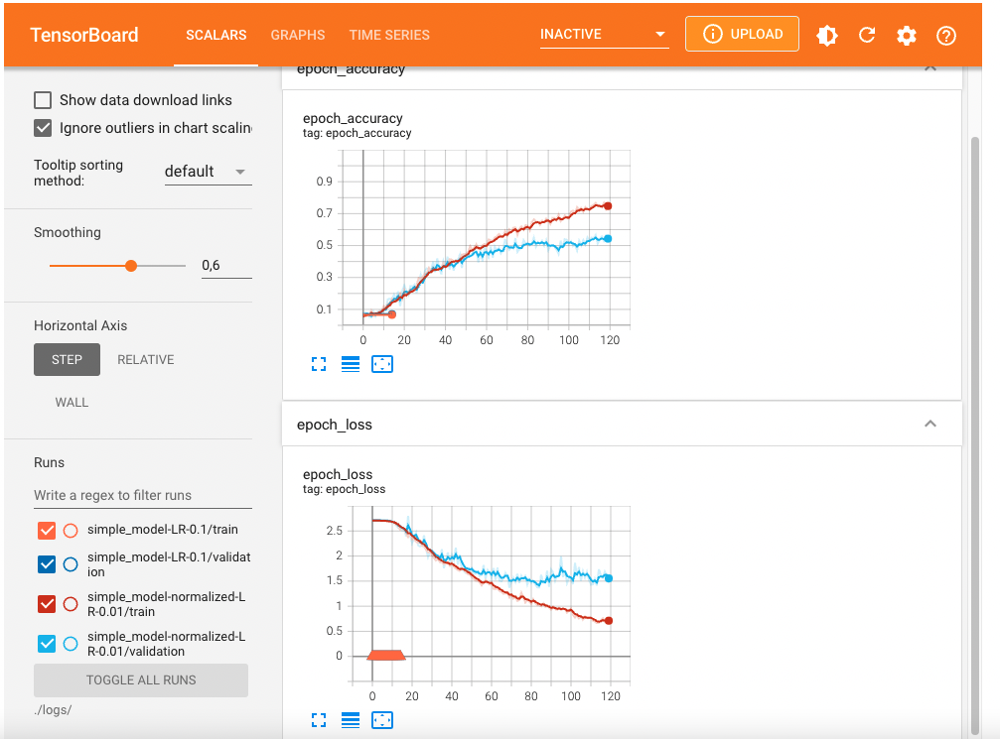

#### Evaluación

In [ ]:
from typing import Iterator
import IPython
from web_page import create_results_webpage

In [ ]:
def predict_model(model: Model, test_data: Iterator) -> List[str]:
    """Predicts category labels for a given keras model

    Args:
        model: Pretrained keras model
        test_data: Datagenerator to predict classes
    Returns:
        String labels for each data point in our data generator.
    """
    test_data.shuffle = False
    predicted_norm_test = model.predict(test_data)
    predicted_classes = np.argmax(model.predict(test_data), axis=1)
    class_names = test_data.class_indices
    class_dict = {value: key for key, value in class_names.items()}
    predicted_labels = [class_dict[key] for key in predicted_classes]
    return predicted_labels

In [ ]:
simple_model.load_weights(check_point_scaled)

In [ ]:
predicted_labels_scaled = predict_model(simple_model, test_data)

In [ ]:
class_names = test_data.class_indices
class_dict = {value:key for key,value in class_names.items()}
real_classes = test_data.labels
real_labels = [class_dict[key] for key in real_classes]

In [ ]:
train_labels = train_df['category'].values
test_labels = test_df['category'].values
train_image_paths = train_df['image_path']._values
test_image_paths = test_df['image_path'].values

In [ ]:
html = create_results_webpage(train_image_paths, test_image_paths, train_labels, real_labels, categories, abbr_categories, predicted_labels_scaled)

In [ ]:
display(IPython.display.HTML(html))

### Regularización y Mejoras [Opcional] ###

Analizando los resultados anteriores podemos ver que nuestro modelo tiene resultados buenos (**Accuracy ~55%**) pero tal vez se puedan obtener algunos resultados mejores si se regulariza el modelo. Un valor normal para la configuración de weight decay es $\lambda= 0.0005$ . Utilizar la función `create_model` para agregar regularización al modelo y verificar si los resultados mejoran. También es posible agregar más datos al entrenamiento como agrandar el tamaño de entrada de las imágenes para obtener mejoras en el entrenamiento.

In [ ]:
### YOUR NEW TRAININGS

# Parte 3: Transfer Learning 

Como se puede ver en la parte 2 de este práctico, en general, entrenar un modelo custom de deep learning es una tarea complicada ya que hay que definir muchos hyperparámetros como por ejemplo:
- **Learning Rate**
- **Regularización a utilizar y _cantidad_ de regularización**
- **Tamaño del Batch**

Por otro lado también es necesarion definir la configuración de la red en si misma:
- **Cantidad de capas y filtros de convolución**
- **Funciones de activación**
- **Pooling**
- **Cantidad de capas _fully-connected_ y cantidad de parámetros por capa.**

Por la tanto muchas veces es más simple trabajar sobre una arquitectura de red profunda conocida como es el caso de [MobilenetsV2](https://arxiv.org/abs/1801.04381). También es posible favorecernos de redes preentrenadas con grandes catidades de imágenes como [ImageNet](https://www.image-net.org/) y que nos permiten aplicar una técnica que se llama **Transfer learning**. Esta técnica consiste en utilizar las capas de convolución de una red preentrenada y conocida como feature extractor y luego entrenar nuestra propia sección de clasificación compuesta de capas _fully-connected_ para entrenar un clasificador potente y con pocos datos de entrenamiento.

Para ello se pide utilizar el siguiente tutorial [Transfer Learning Keras](https://www.tensorflow.org/tutorials/images/transfer_learning) para hacer transfer learning y optimizar una red preentrenada para que aprenda a clasificar nuestros datos. 

Utilizando Transfer Learning es posible llegar a un **$85 \%$** de Accuracy en los datos de validación con unas pocas epochs de entrenamiento.

In [ ]:
IMG_SHAPE = (96,96,3)
base_model = tf.keras.applications.MobileNetV2(input_shape=IMG_SHAPE,
                                               include_top=False,
                                               weights='imagenet')

In [ ]:
base_model.summary()

In [ ]:
### ADD NEW LAYERS TO THE MODEL
tl_model = #

In [ ]:
### Use this preprocessing function on your data generators
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input


In [ ]:
train_generator = #
validation_generator = #
test_generator = #

In [ ]:
### Generate the correct flow from dataframe
train_data = #
validation_data = #
test_data = #

In [ ]:
tl_model_checkpoint = os.path.join("./checkpoints", "tl_model.keras")

In [ ]:
LR = 0.0001

In [ ]:
### ADD YOUR TRAINIG CODE HERE

In [ ]:
tl_model.load_weights(tl_model_checkpoint)

In [ ]:
predicted_labels_tl = predict_model(tl_model, test_data)

In [ ]:
class_names = test_data.class_indices
class_dict = {value: key for key, value in class_names.items()}
real_classes = test_data.labels
real_labels = [class_dict[key] for key in real_classes]
train_labels = train_df["category"].values
test_labels = test_df["category"].values
train_image_paths = train_df["image_path"]._values
test_image_paths = test_df["image_path"].values

In [ ]:
html = create_results_webpage(
    train_image_paths, test_image_paths, train_labels, real_labels, categories, abbr_categories, predicted_labels_tl
)

In [ ]:
display(IPython.display.HTML(html))

# Evaluación de Clasificadores


In [ ]:
from web_page import create_results_webpage
from sklearn.metrics import accuracy_score

In [ ]:
tl_accuracy = accuracy_score(test_labels, predicted_labels_tl)

In [ ]:
tl_accuracy

In [ ]:
custom_model_accuracy = accuracy_score(test_labels,predicted_labels_scaled)

In [ ]:
custom_model_accuracy

In [ ]:
predicted_labels_knn = np.load('./predicted_labels_knn.npy', allow_pickle=True)

In [ ]:
knn_accuracy = accuracy_score(test_labels,predicted_labels_knn)

In [ ]:
predicted_labels_bow = np.load('./predicted_labels_bow.npy', allow_pickle=True)

In [ ]:
bow_accuracy = accuracy_score(test_labels, predicted_labels_bow)

In [ ]:
clf_names = ["KNN", "BAG OF WORDS", "CUSTOM CNN", "Mobilenet TL"]
clf_results = [
    f"{knn_accuracy*100:.2f}%",
    f"{bow_accuracy*100:.2f} %",
    f"{custom_model_accuracy*100:.2f} %",
    f"{tl_accuracy*100:.2f} %",
]
results_df = pd.DataFrame(data={"Classifier": clf_names, "Test Acc": clf_results})

In [ ]:
results_df